# Bacteria Image Classification


### Necessary Imports

In [1]:
import os

import torch
from torchvision import datasets, transforms

from mia.classification import ImageClassifierTrainer
from mia.datasets import DatasetDownloader, classification_datasets
from mia.plotting import visualize_class_samples, plot_image_grid
from mia.prompts import classification_prompt

from mia.utils import initialize_evaluators, evaluate_dataset, evaluate_image
from vlm.clip import CLIPEvaluator
from vlm.pali_gemma import PaliGemmaEvaluator


%load_ext autoreload
%autoreload 2

# Determine the device to use (GPU if available, otherwise CPU)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {device}")

Device: cpu


### Download the DIBaS dataset from https://github.com/gallardorafael/DIBaS-Dataset


In [2]:
downloader = DatasetDownloader(classification_datasets, download_dir=os.path.join('datasets', 'Classification'))
downloader.download_and_extract()

Extracted Acinetobacter.baumanii.zip into datasets/Classification/Acinetobacter.baumanii
Extracted Actinomyces.israeli.zip into datasets/Classification/Actinomyces.israeli
Extracted Bacteroides.fragilis.zip into datasets/Classification/Bacteroides.fragilis
Extracted Bifidobacterium.spp.zip into datasets/Classification/Bifidobacterium.spp
Extracted Candida.albicans.zip into datasets/Classification/Candida.albicans
Extracted Clostridium.perfringens.zip into datasets/Classification/Clostridium.perfringens
Extracted Enterococcus.faecium.zip into datasets/Classification/Enterococcus.faecium
Extracted Enterococcus.faecalis.zip into datasets/Classification/Enterococcus.faecalis
Extracted Escherichia.coli.zip into datasets/Classification/Escherichia.coli
Extracted Fusobacterium.zip into datasets/Classification/Fusobacterium
Extracted Lactobacillus.casei.zip into datasets/Classification/Lactobacillus.casei
Extracted Lactobacillus.crispatus.zip into datasets/Classification/Lactobacillus.crispatu

### Visualize the dataset


Visualization saved to results/Classification/class_samples.png


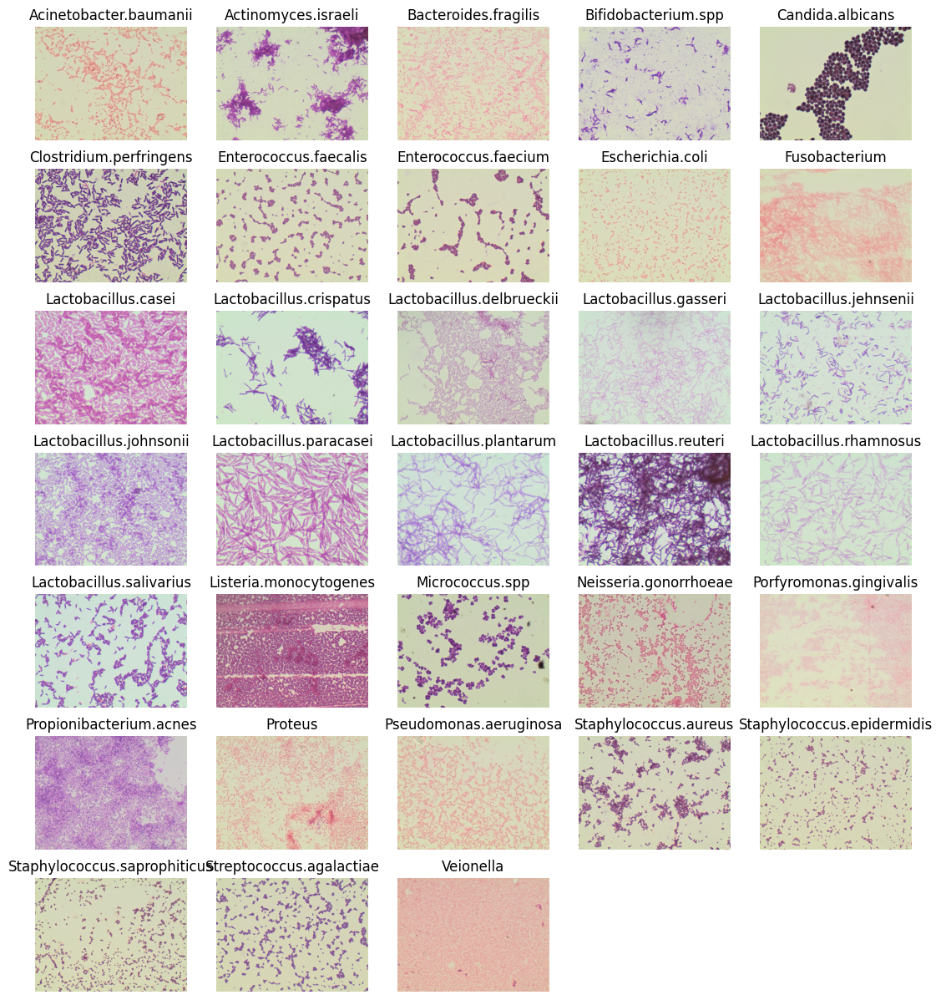

In [3]:
data_dir = os.path.join('datasets', 'Classification')

# Load the dataset (without splitting) to visualize images
full_dataset = datasets.ImageFolder(data_dir, transform=transforms.ToTensor())
class_names = full_dataset.classes

# Visualize one image per class in a grid and save it
visualize_class_samples(full_dataset, class_names, num_classes=len(class_names))

### Train a image classifier using the ResNet50 model

##### Other available models are:
* ResNet: resnet18, resnet34, resnet50, resnet101, resnet152
* VGG: vgg11, vgg13, vgg16, vgg19
* DenseNet: densenet121, densenet169, densenet201, densenet161
* MobileNet: mobilenet_v2, mobilenet_v3_small, mobilenet_v3_large
* EfficientNet: efficientnet_b0 to efficientnet_b7
* Inception v3: inception_v3


Epoch 1/50


Train Loss: 2.3564 	 Train Acc: 0.3610
Val Loss: 19.0502 	 Val Acc: 0.1456
Epoch 2/50


Train Loss: 1.5919 	 Train Acc: 0.5187
Val Loss: 4.1065 	 Val Acc: 0.3981
Epoch 3/50


Train Loss: 1.2010 	 Train Acc: 0.6058
Val Loss: 4.2907 	 Val Acc: 0.3398
Epoch 4/50


Train Loss: 0.8440 	 Train Acc: 0.7469
Val Loss: 3.9762 	 Val Acc: 0.3786
Epoch 5/50


Train Loss: 0.7992 	 Train Acc: 0.7407
Val Loss: 6.0084 	 Val Acc: 0.4563
Epoch 6/50


Train Loss: 0.6549 	 Train Acc: 0.7946
Val Loss: 1.2534 	 Val Acc: 0.6796
Epoch 7/50


Train Loss: 0.7676 	 Train Acc: 0.7593
Val Loss: 1.6052 	 Val Acc: 0.6019
Epoch 8/50


Train Loss: 0.8210 	 Train Acc: 0.7531
Val Loss: 4.1976 	 Val Acc: 0.5922
Epoch 9/50


Train Loss: 0.7584 	 Train Acc: 0.7614
Val Loss: 1.7256 	 Val Acc: 0.6796
Epoch 10/50


Train Loss: 0.6639 	 Train Acc: 0.7925
Val Loss: 3.3545 	 Val Acc: 0.4369
Epoch 11/50


Train Loss: 0.7346 	 Train Acc: 0.7656
Val Loss: 3.4578 	 Val Acc: 0.4563
Epoch 12/50


Train Loss: 0.5047 	 Train Acc: 0.8527
Val Loss: 1.4077 	 Val Acc: 0.6893
Epoch 13/50


Train Loss: 0.5913 	 Train Acc: 0.8278
Val Loss: 2.1315 	 Val Acc: 0.6019
Epoch 14/50


Train Loss: 0.4755 	 Train Acc: 0.8693
Val Loss: 1.4121 	 Val Acc: 0.7087
Epoch 15/50


Train Loss: 0.4824 	 Train Acc: 0.8402
Val Loss: 1.1519 	 Val Acc: 0.7087
Epoch 16/50


Train Loss: 0.3817 	 Train Acc: 0.8921
Val Loss: 1.2240 	 Val Acc: 0.7476
Epoch 17/50


Train Loss: 0.3420 	 Train Acc: 0.8838
Val Loss: 1.0852 	 Val Acc: 0.7476
Epoch 18/50


Train Loss: 0.2693 	 Train Acc: 0.9191
Val Loss: 0.8636 	 Val Acc: 0.8252
Epoch 19/50


Train Loss: 0.3113 	 Train Acc: 0.9004
Val Loss: 0.6481 	 Val Acc: 0.8350
Epoch 20/50


Train Loss: 0.3340 	 Train Acc: 0.9108
Val Loss: 1.1749 	 Val Acc: 0.7087
Epoch 21/50


Train Loss: 0.3297 	 Train Acc: 0.9108
Val Loss: 0.7192 	 Val Acc: 0.8058
Epoch 22/50


Train Loss: 0.2889 	 Train Acc: 0.9212
Val Loss: 0.8321 	 Val Acc: 0.7767
Epoch 23/50


Train Loss: 0.2555 	 Train Acc: 0.9108
Val Loss: 0.4784 	 Val Acc: 0.9126
Epoch 24/50


Train Loss: 0.3220 	 Train Acc: 0.9046
Val Loss: 2.7220 	 Val Acc: 0.5825
Epoch 25/50


Train Loss: 0.3607 	 Train Acc: 0.8942
Val Loss: 2.0713 	 Val Acc: 0.5534
Epoch 26/50


Train Loss: 0.3801 	 Train Acc: 0.9004
Val Loss: 1.4685 	 Val Acc: 0.7184
Epoch 27/50


Train Loss: 0.4789 	 Train Acc: 0.8506
Val Loss: 3.6906 	 Val Acc: 0.5631
Epoch 28/50


Train Loss: 0.4182 	 Train Acc: 0.8880
Val Loss: 1.2715 	 Val Acc: 0.6990
Epoch 29/50


Train Loss: 0.2483 	 Train Acc: 0.9232
Val Loss: 3.9669 	 Val Acc: 0.5437
Epoch 30/50


Train Loss: 0.2817 	 Train Acc: 0.9025
Val Loss: 1.7707 	 Val Acc: 0.6699
Epoch 31/50


Train Loss: 0.3236 	 Train Acc: 0.9066
Val Loss: 0.8377 	 Val Acc: 0.7476
Epoch 32/50


Train Loss: 0.2103 	 Train Acc: 0.9295
Val Loss: 2.3541 	 Val Acc: 0.6893
Epoch 33/50


Train Loss: 0.1652 	 Train Acc: 0.9564
Val Loss: 0.5595 	 Val Acc: 0.8835
Epoch 34/50


Train Loss: 0.2106 	 Train Acc: 0.9357
Val Loss: 1.2005 	 Val Acc: 0.8155
Epoch 35/50


Train Loss: 0.3272 	 Train Acc: 0.9025
Val Loss: 0.6993 	 Val Acc: 0.8738
Epoch 36/50


Train Loss: 0.2604 	 Train Acc: 0.9170
Val Loss: 1.3049 	 Val Acc: 0.6893
Epoch 37/50


Train Loss: 0.2618 	 Train Acc: 0.9191
Val Loss: 1.3162 	 Val Acc: 0.7670
Epoch 38/50


Train Loss: 0.2939 	 Train Acc: 0.9046
Val Loss: 0.8571 	 Val Acc: 0.8155
Epoch 39/50


Train Loss: 0.2857 	 Train Acc: 0.9170
Val Loss: 1.3104 	 Val Acc: 0.6990
Epoch 40/50


Train Loss: 0.2059 	 Train Acc: 0.9274
Val Loss: 0.9105 	 Val Acc: 0.7961
Epoch 41/50


Train Loss: 0.1838 	 Train Acc: 0.9523
Val Loss: 0.3690 	 Val Acc: 0.9126
Epoch 42/50


Train Loss: 0.0957 	 Train Acc: 0.9813
Val Loss: 0.4813 	 Val Acc: 0.9029
Epoch 43/50


Train Loss: 0.1109 	 Train Acc: 0.9585
Val Loss: 0.4198 	 Val Acc: 0.9126
Epoch 44/50


Train Loss: 0.1030 	 Train Acc: 0.9710
Val Loss: 0.4709 	 Val Acc: 0.8738
Epoch 45/50


Train Loss: 0.1931 	 Train Acc: 0.9440
Val Loss: 0.7046 	 Val Acc: 0.8058
Epoch 46/50


Train Loss: 0.2018 	 Train Acc: 0.9419
Val Loss: 0.9977 	 Val Acc: 0.7670
Epoch 47/50


Train Loss: 0.1382 	 Train Acc: 0.9502
Val Loss: 2.5981 	 Val Acc: 0.6019
Epoch 48/50


Train Loss: 0.1763 	 Train Acc: 0.9481
Val Loss: 0.4274 	 Val Acc: 0.9029
Epoch 49/50


Train Loss: 0.2212 	 Train Acc: 0.9398
Val Loss: 2.2432 	 Val Acc: 0.4757
Epoch 50/50


Train Loss: 0.1759 	 Train Acc: 0.9523
Val Loss: 0.8798 	 Val Acc: 0.8350


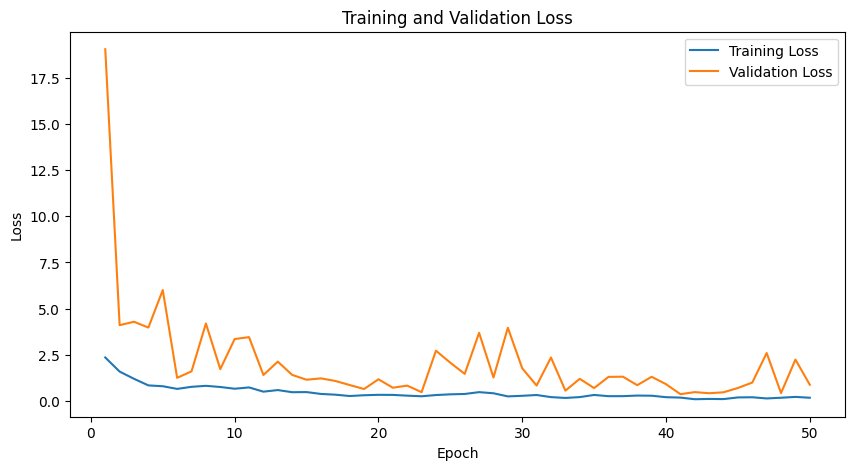

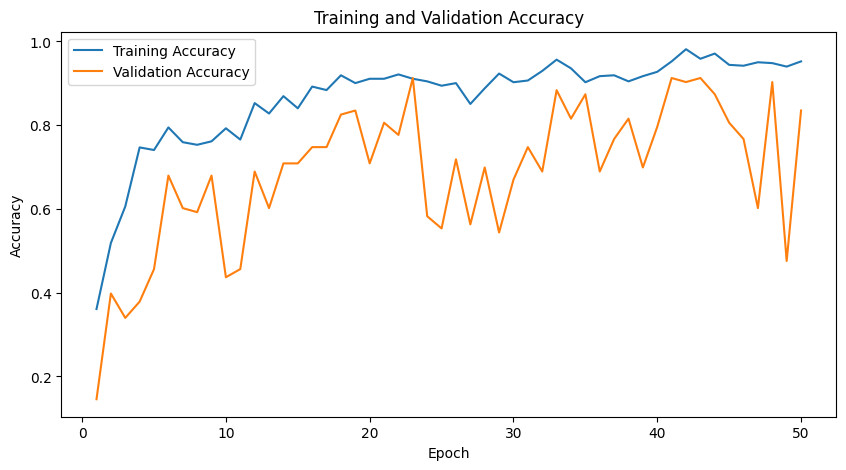

In [4]:
data_dir = os.path.join('datasets', 'Classification')
models_dir = os.path.join('models', 'Classification')
os.makedirs(models_dir, exist_ok=True)

# Specify the model architecture 
model_name = 'resnet50'  

# Initialize the trainer
trainer = ImageClassifierTrainer(
    data_dir=data_dir,
    batch_size=32,
    num_epochs=50,
    learning_rate=0.001,
    model_name=model_name
)
trainer.train()


### Evaluate the trained model

Model loaded from models/Classification/best_model_resnet50.pt


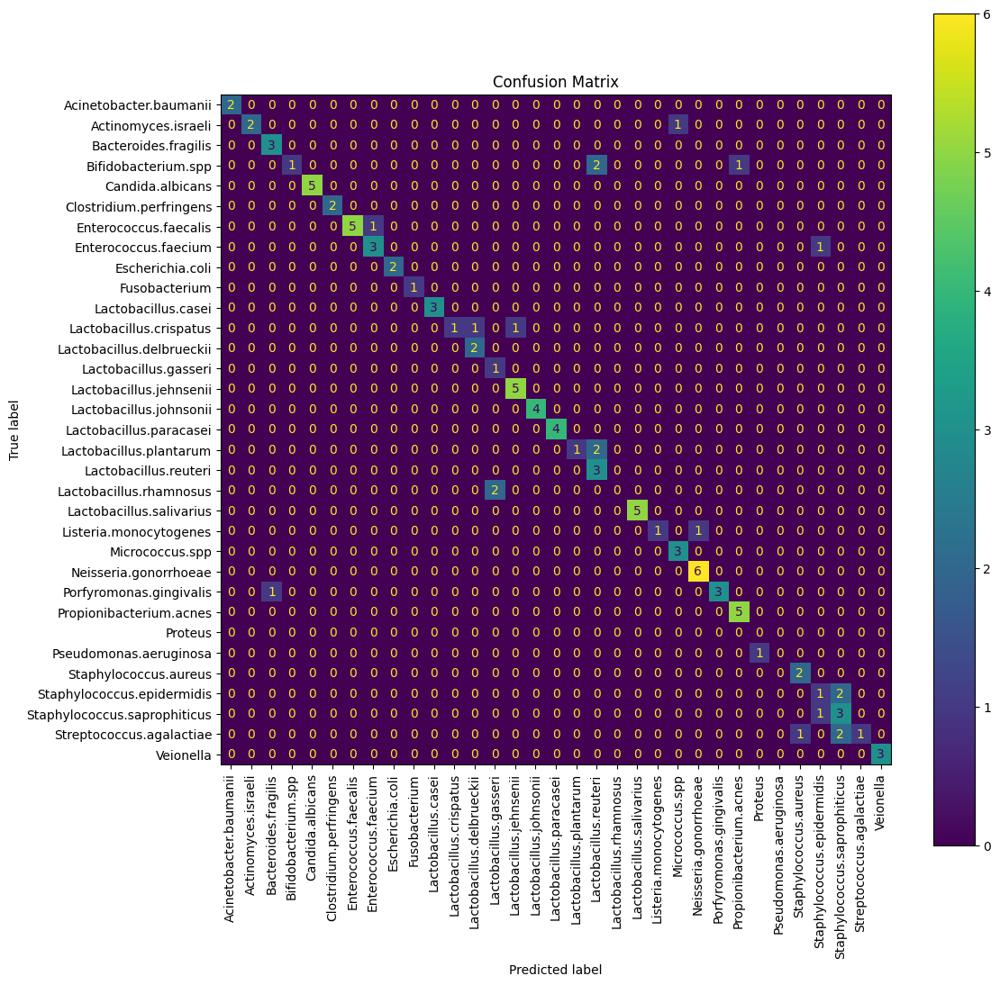


Classification Report:
                              precision    recall  f1-score   support

      Acinetobacter.baumanii       1.00      1.00      1.00         2
         Actinomyces.israeli       1.00      0.67      0.80         3
        Bacteroides.fragilis       0.75      1.00      0.86         3
         Bifidobacterium.spp       1.00      0.25      0.40         4
            Candida.albicans       1.00      1.00      1.00         5
     Clostridium.perfringens       1.00      1.00      1.00         2
       Enterococcus.faecalis       1.00      0.83      0.91         6
        Enterococcus.faecium       0.75      0.75      0.75         4
            Escherichia.coli       1.00      1.00      1.00         2
               Fusobacterium       1.00      1.00      1.00         1
         Lactobacillus.casei       1.00      1.00      1.00         3
     Lactobacillus.crispatus       1.00      0.33      0.50         3
   Lactobacillus.delbrueckii       0.67      1.00      0.80      

In [5]:
trainer_loaded = ImageClassifierTrainer(
    data_dir=data_dir,
    model_name=model_name,
    model_path=os.path.join(models_dir, f'best_model_{model_name}.pt')
)
trainer_loaded.evaluate()

# Evaluate Vision Language Models
## Available models:
* PaliGemma
* PhiVision
* QwenVL
* Vilt
* VisualBert
* BLIP
* BLIP2

### 1. Define which VLMs should be evaluated

In [6]:
EVALUATORS_CONFIG = {
    "CLIP": CLIPEvaluator,
    # "PaliGemma": PaliGemmaEvaluator,
    # "PhiVision": PhiVisionEvaluator,
    # "QwenVL": QwenVLEvaluator,
    # "Vilt": ViltEvaluator,
    # "VisualBert": VisualBertEvaluator,
    # "BLIP": BLIPEvaluator,
    # "BLIP2": BLIP2Evaluator, 
}

### 2. Initialize the evaluators (this may take a while the first time)

In [7]:
evaluators = initialize_evaluators(device, EVALUATORS_CONFIG)

Initialized CLIP in 2.09 seconds


### 3. Define the dataset and description to get a good prompt

In [8]:
dataset_name = 'Digital Image of Bacterial Species'
dataset_description = '''
The dataset from the study "Deep learning approach to bacterial colony classification" comprises 660 images representing 33 different genera and species of bacteria. 
This dataset, called DIBaS (Digital Image of Bacterial Species), was created for bacterial classification using deep learning methods. 
The images were taken with a microscope and analyzed using Convolutional Neural Networks (CNNs) and machine learning classifiers like Support Vector Machines (SVM) and Random Forest. 
The dataset is publicly available for research purposes, allowing for advancements in bacterial recognition systems.
'''
dataset_path = 'datasets/Classification'

prompt = classification_prompt(dataset_name, dataset_description, dataset_path)
print("-----------------")
print(f"{prompt}")
print("-----------------")


-----------------

I have a dataset titled 'Digital Image of Bacterial Species' with the following description: 

The dataset from the study "Deep learning approach to bacterial colony classification" comprises 660 images representing 33 different genera and species of bacteria. 
This dataset, called DIBaS (Digital Image of Bacterial Species), was created for bacterial classification using deep learning methods. 
The images were taken with a microscope and analyzed using Convolutional Neural Networks (CNNs) and machine learning classifiers like Support Vector Machines (SVM) and Random Forest. 
The dataset is publicly available for research purposes, allowing for advancements in bacterial recognition systems.


The dataset consists of images of the following classes: ['Proteus', 'Lactobacillus.plantarum', 'Lactobacillus.johnsonii', 'Lactobacillus.rhamnosus', 'Lactobacillus.jehnsenii', 'Acinetobacter.baumanii', 'Neisseria.gonorrhoeae', 'Clostridium.perfringens', 'Enterococcus.faecium', '

### 4. Evaluate the dataset
But only a few images per class is evaluated to avoid long execution times.

In [9]:
num_images_per_class = 1
num_classes = 33

result_image_paths = evaluate_dataset(evaluators, dataset_name, dataset_description, dataset_path, num_images_per_class, num_classes)

Dataset: Digital Image of Bacterial Species
	Class 0: Proteus
	Sample image: datasets/Classification/Proteus/Proteus_0008.tif
		CLIP Output: Staphylococcus.saprophiticus (Evaluated in 0.60 seconds)
	Class 1: Lactobacillus.plantarum
	Sample image: datasets/Classification/Lactobacillus.plantarum/Lactobacillus.plantarum_0008.tif
		CLIP Output: Micrococcus.spp (Evaluated in 0.06 seconds)
	Class 2: Lactobacillus.johnsonii
	Sample image: datasets/Classification/Lactobacillus.johnsonii/Lactobacillus.johnsonii_0019.tif
		CLIP Output: Staphylococcus.epidermidis (Evaluated in 0.06 seconds)
	Class 3: Lactobacillus.rhamnosus
	Sample image: datasets/Classification/Lactobacillus.rhamnosus/Lactobacillus.rhamnosus_0007.tif
		CLIP Output: Clostridium.perfringens (Evaluated in 0.06 seconds)
	Class 4: Lactobacillus.jehnsenii
	Sample image: datasets/Classification/Lactobacillus.jehnsenii/Lactobacillus.jehnsenii_0013.tif
		CLIP Output: Lactobacillus.plantarum (Evaluated in 0.06 seconds)
	Class 5: Acinetoba

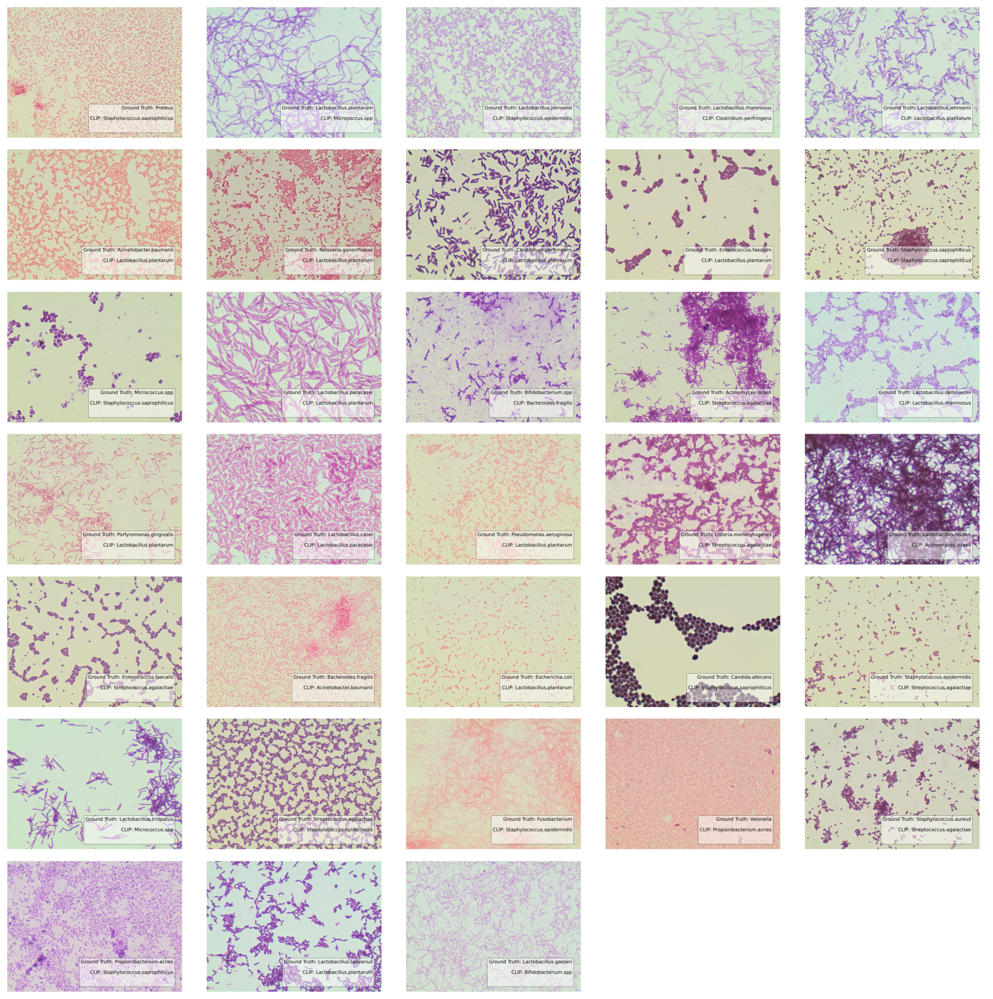

In [10]:
plot_image_grid(result_image_paths, num_classes, image_name="vlm_classification_results.png")

# Testing VLM on public images from the web

In [11]:
image_pathes = [
    "https://www.uni-assist.de/fileadmin/_processed_/d/5/csm_htw-berlin_Friederike_Coenen_36e250c32e.jpg",
    "https://www.htw-berlin.de/files/Presse/_tmp_/2/2/csm_HTW-Berlin-HTW-Imagefotos-DSC216129-HTW_Berlin-Alexander_Rentsch_f044c85c99.jpg",
    ]

# Configuration for evaluators
EVALUATORS_CONFIG = {
    # "CLIP": CLIPEvaluator,
    "PaliGemma": PaliGemmaEvaluator,
    # "PhiVision": PhiVisionEvaluator,
    # "QwenVL": QwenVLEvaluator,
    # "Vilt": ViltEvaluator,
    # "VisualBert": VisualBertEvaluator,
    # "BLIP": BLIPEvaluator,
    # "BLIP2": BLIP2Evaluator,
}

# Initialize evaluators
evaluators = initialize_evaluators(device, EVALUATORS_CONFIG)

# Prompt to use for evaluation
prompt = "Describe the image:"
result_images = []

# Iterate over each dataset and evaluate
for image_path in image_pathes:
    result_image_path = evaluate_image(evaluators, image_path, prompt)
    result_images.append(result_image_path)
    


`config.hidden_act` is ignored, you should use `config.hidden_activation` instead.
Gemma's activation function will be set to `gelu_pytorch_tanh`. Please, use
`config.hidden_activation` if you want to override this behaviour.
See https://github.com/huggingface/transformers/pull/29402 for more details.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Initialized PaliGemma in 2.87 seconds
PaliGemma Output: In this image we can see a group of people sitting on the grass. In the background, we can see a group of people standing, a group of trees, a group of buildings, a group of poles, a group of people sitting on the bench, a group of people standing on the road and the sky. (Evaluated in 34.15 seconds)
PaliGemma Output: In this image we can see three persons sitting on the red color object. In the background, we can see the building, trees, plants, grass and the sky. (Evaluated in 5.90 seconds)


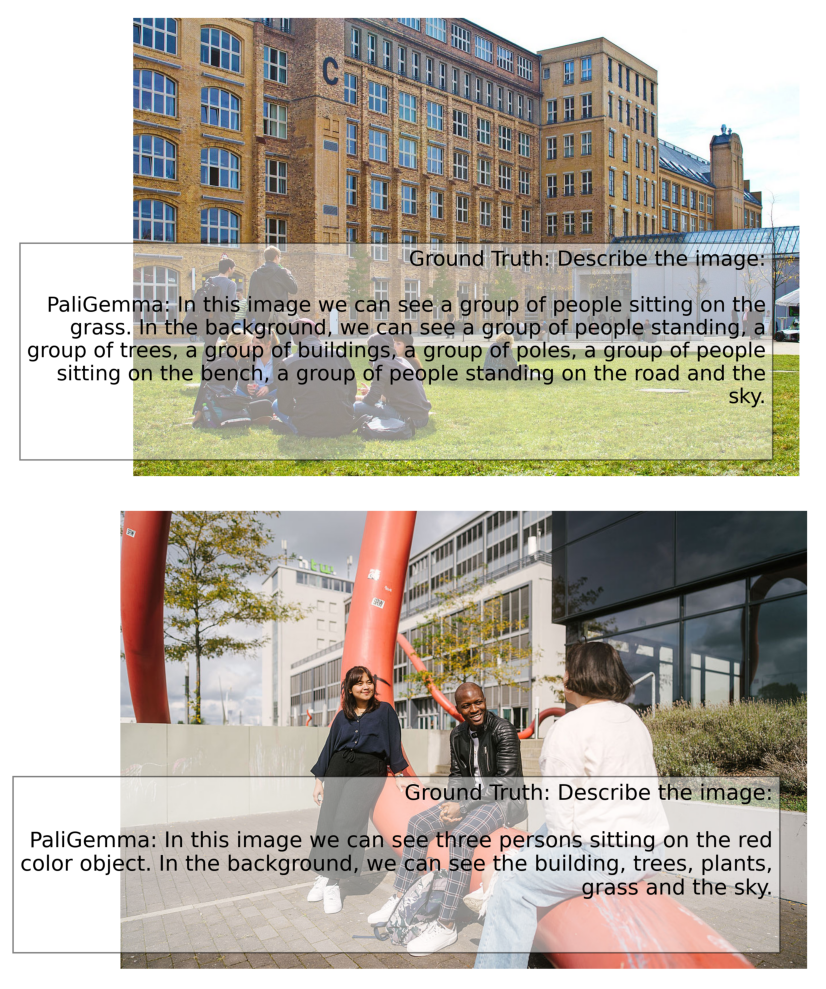

In [12]:
plot_image_grid(result_images, 2, rows=1, figsize=(10, 10), image_name="vlm_prompting_results.png")